## STL Decomposition & Time Series Feature Analysis
This notebook demonstrates package loading, data import, initial graphical checks, STL decomposition for every NHS group/metric, and summary feature extraction for downstream modeling.

1. 🚚 Load Packages and Set Display Options

**Note:**  
- Specialised packages for trend/seasonal decomposition (`STL`) and feature extraction (`tsfeatures`) are used.
- Plot defaults and color cycles are globally set for consistent NHS reporting visuals.

In [1]:
import calendar
import os

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statsmodels.tsa.seasonal import STL
from tsfeatures import *
from utilsforecast.plotting import plot_series

plt.style.use("ggplot")
import matplotlib as mpl
from cycler import cycler

mpl.rcParams["axes.prop_cycle"] = cycler(color=["pink", "blue", "black", "red"])
plt.rcParams.update(
    {
        "figure.figsize": (8, 5),
        "figure.dpi": 100,
        "savefig.dpi": 300,
        "figure.constrained_layout.use": True,
        "axes.titlesize": 12,
        "axes.labelsize": 10,
        "xtick.labelsize": 9,
        "ytick.labelsize": 9,
        "legend.fontsize": 9,
        "legend.title_fontsize": 10,
    }
)
pd.set_option("display.precision", 3)

## 2. 📥 Import Data

- Data is imported from the combined, clean, monthly NHS workforce metrics CSV.
- All column names standardised to lowercase and whitespace-trimmed: this prevents many subtle bugs in groupby, querying, and plotting.

In [2]:
base_dir = r"C:\Users\Destinee.HassanBien\Documents\Desys Work"
all_agg_file = os.path.join(base_dir, "combined_workforce_monthly_new.csv")
all_agg = pd.read_csv(all_agg_file, parse_dates=["month"])
all_agg.columns = all_agg.columns.str.lower().str.strip()

## 3. 🔍 Raw Time Series Quick Check (Top Group)
- Use this plot to confirm top groups have continuous, plausible data.
- Outliers, jumps, or obvious gaps signal missing/inconsistent reporting or real-world events.
- **To Do:** Annotate/flag visible spikes or drops in comments for key groups!

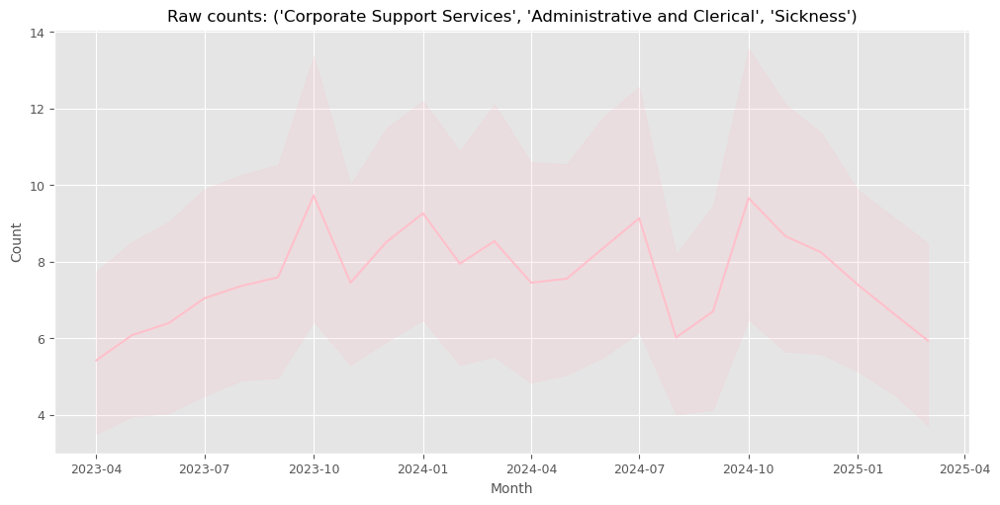

In [3]:
sample_group = (
    all_agg.groupby(["service group", "staff group", "metric"]).size().idxmax()
)
sample_df = all_agg[
    (all_agg["service group"] == sample_group[0])
    & (all_agg["staff group"] == sample_group[1])
    & (all_agg["metric"] == sample_group[2])
].sort_values("month")

plt.figure(figsize=(10, 5))
sns.lineplot(x="month", y="count", data=sample_df)
plt.title(f"Raw counts: {sample_group}")
plt.xlabel("Month")
plt.ylabel("Count")
plt.show()

## 4. 🛠️ Impute or Drop Missing Values (Panel Clean-up)

**Warning**
- Forward-fill (`ffill()`) is safe for short gaps but may hide underlying issues
     - always audit imputed panels.
- **To Do:** Save a list of any groups with more than chosen consecutive months of imputation for QA review.

In [4]:
# Drop or impute missing count values if any
all_agg = (
    all_agg.sort_values(["service group", "staff group", "metric", "month"])
    .groupby(["service group", "staff group", "metric"])
    .apply(lambda df: df.ffill())
    .reset_index(drop=True)
)

## 5. 📊 Summary Statistics for Sample Group
Interpretation:
- High std versus mean, or max far above 75% quantile, means series is bursty or outlier-driven.
- Many zeros in 25/50% quantile? Series may be mostly inactive.

In [5]:
# Quick statistics for a sample group
desc_stats = sample_df["count"].describe()
print("Summary statistics for sample group:\n", desc_stats)

Summary statistics for sample group:
 count    2623.000
mean        7.621
std        14.996
min         0.000
25%         0.000
50%         0.000
75%         6.660
max       116.060
Name: count, dtype: float64


## 6. 📉 Autocorrelation Function (ACF) Plot

- The ACF shows how much “memory” the series has; how predictive last month is for this month.
- **To Do:** List which groups have high lag-1 autocorrelation for Naive vs. ARIMA model selection downstream.

<Figure size 600x300 with 0 Axes>

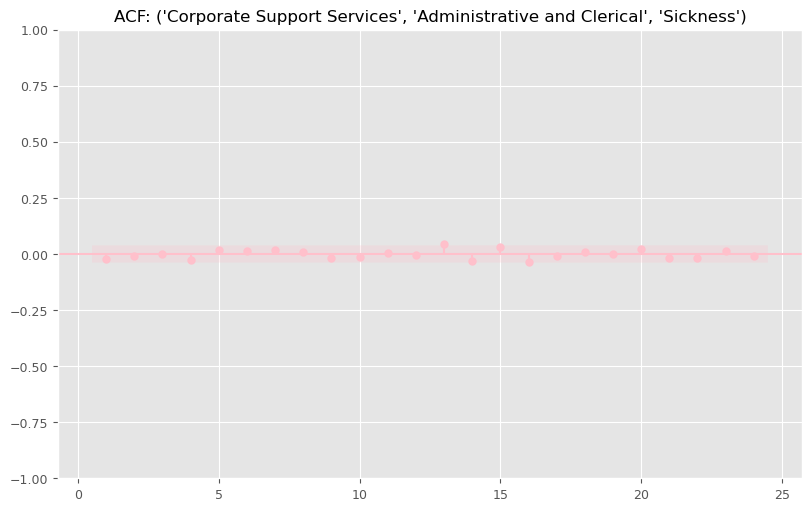

In [6]:
from statsmodels.graphics.tsaplots import plot_acf

plt.figure(figsize=(6, 3))
plot_acf(sample_df["count"].dropna(), lags=24, zero=False)
plt.title(f"ACF: {sample_group}")
plt.show()

## 7. 📦 Find Groups with ≥24 Months Data

Only groups with at least 24 months’ continuous data are kept for STL and robust downstream modeling.
- Save the `diagnostic` frame to share panel coverage with reporting team.

In [7]:
group_cols = ["service group", "staff group", "metric"]

diagnostic = (
    all_agg.groupby(group_cols)["month"]
    .nunique()
    .reset_index()
    .rename(columns={"month": "num_months"})
)
print("Groups and their available month counts:")
print(diagnostic)
long_groups = diagnostic[diagnostic["num_months"] >= 24]

Groups and their available month counts:
               service group                       staff group    metric  \
0    CYP & Families Services   Add Prof Scientific and Technic     Hires   
1    CYP & Families Services   Add Prof Scientific and Technic   Leavers   
2    CYP & Families Services   Add Prof Scientific and Technic  Sickness   
3    CYP & Families Services      Additional Clinical Services     Hires   
4    CYP & Families Services      Additional Clinical Services   Leavers   
..                       ...                               ...       ...   
204        Surgical Services  Nursing and Midwifery Registered     Hires   
205        Surgical Services  Nursing and Midwifery Registered   Leavers   
206        Surgical Services  Nursing and Midwifery Registered  Sickness   
207        Surgical Services                          Students     Hires   
208        Surgical Services                          Students  Sickness   

     num_months  
0            32  
1         

## 8. 🔄 STL Decomposition & tsfeatures Extraction (Main Loop)

**Warning** 
- Looping over all groups may be slow run in batches if working interactively.
- Always use `plt.close(fig)` after every plot in the loop to prevent memory errors/crashes.
- Box-Cox stabilized data is only used if it succeeds; otherwise, raw is analysed.

## 9. 💾 Save tsfeatures Summary Table
**Result:**  
You get a single summary table:  
- One row per group/metric  
- Columns for: trend, seasonal strength, variance, spike, ACF, STL, and distributional statistics

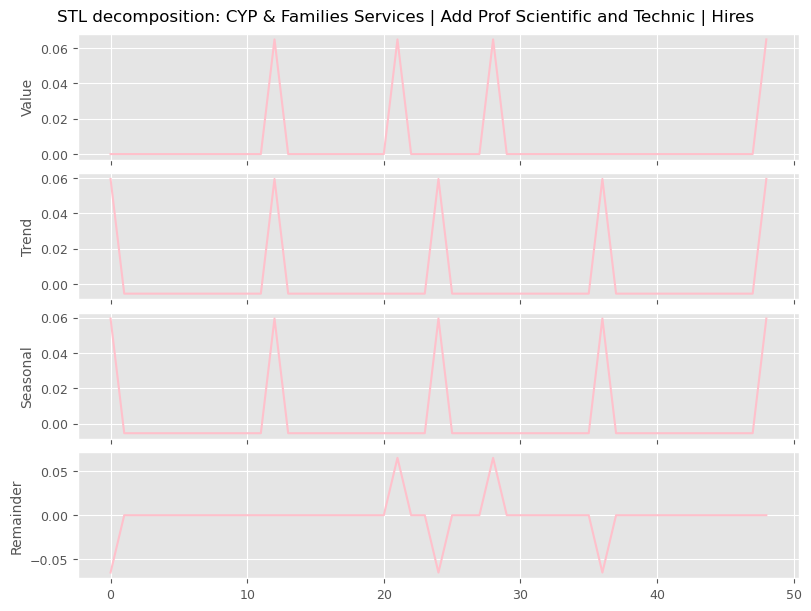

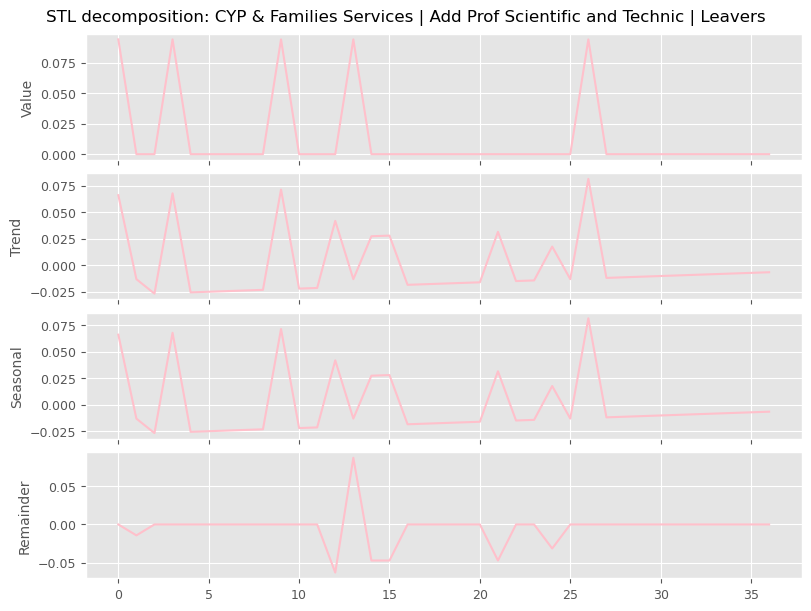

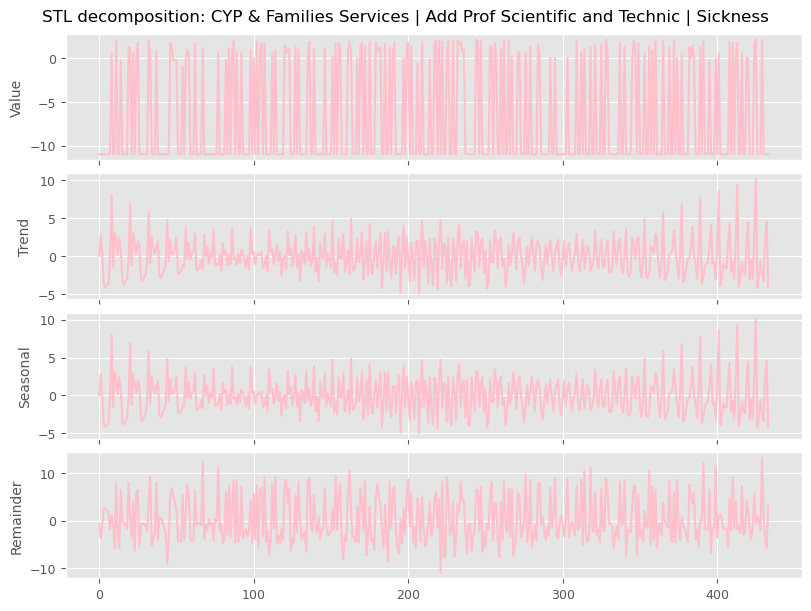

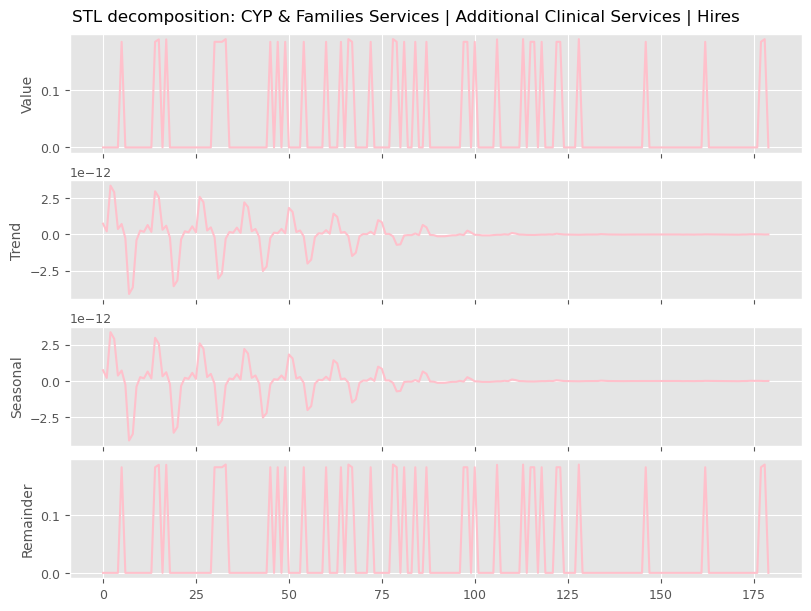

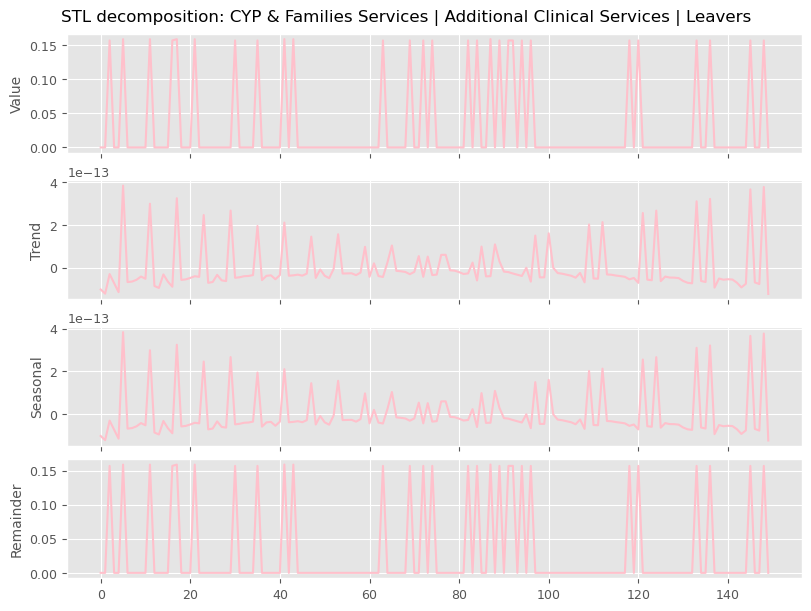

...

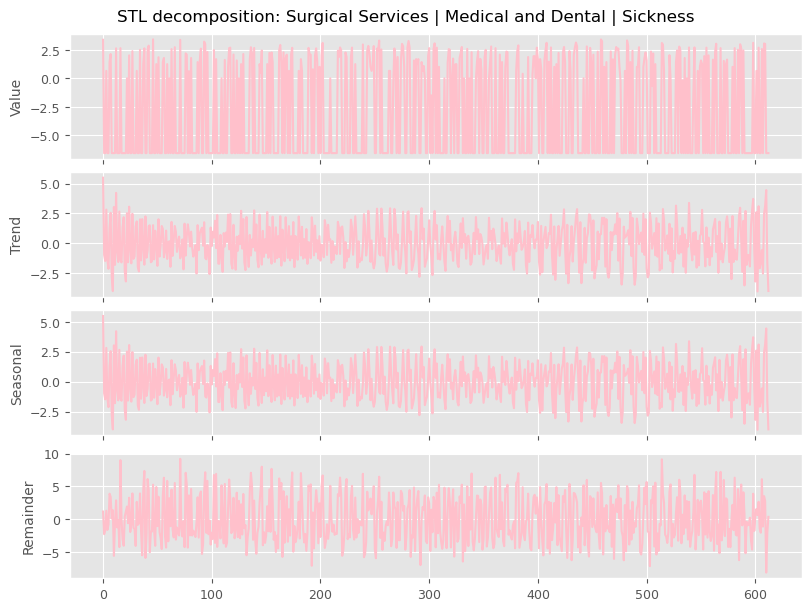

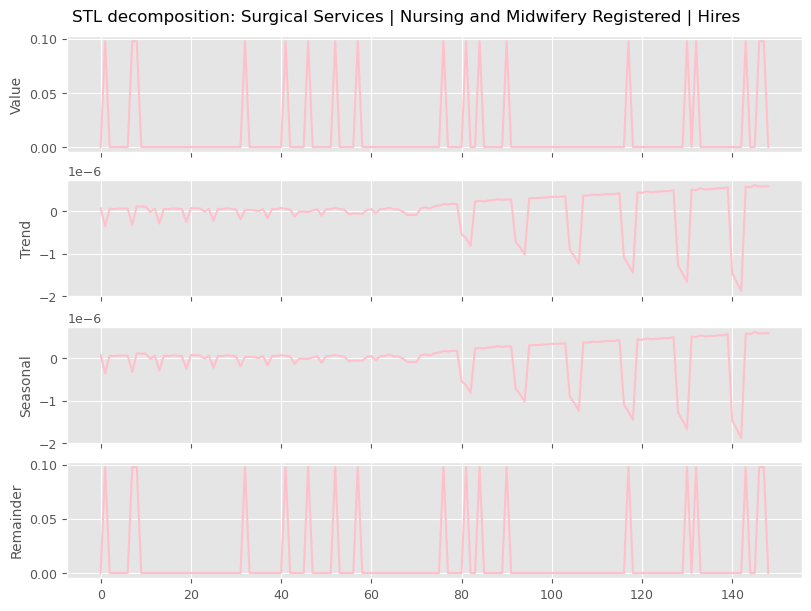

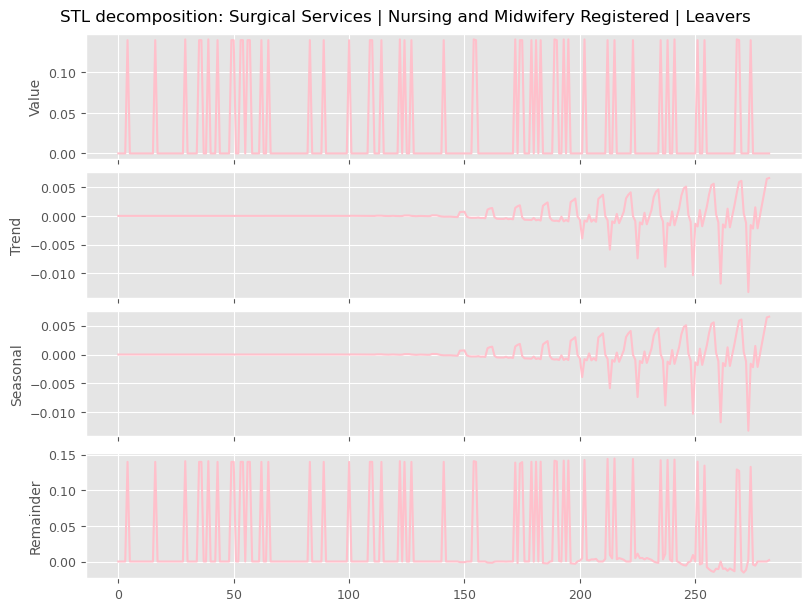

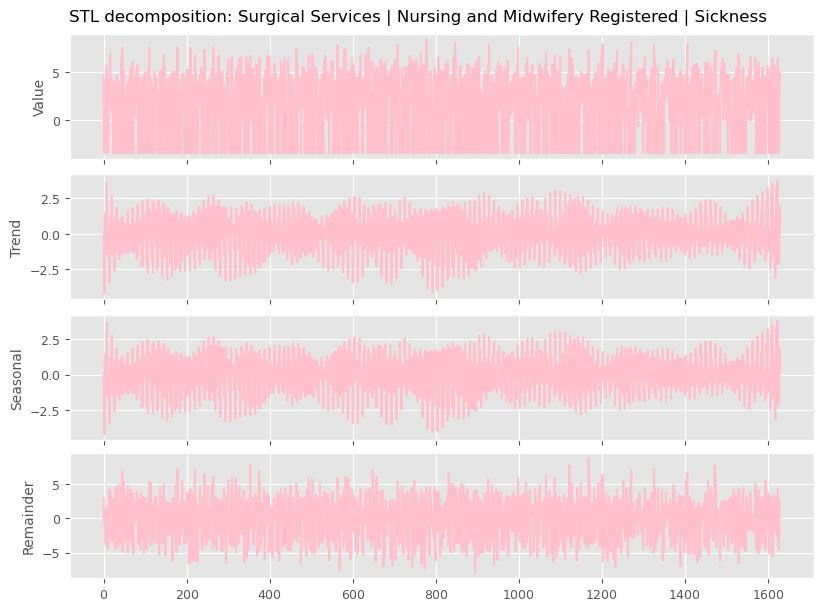

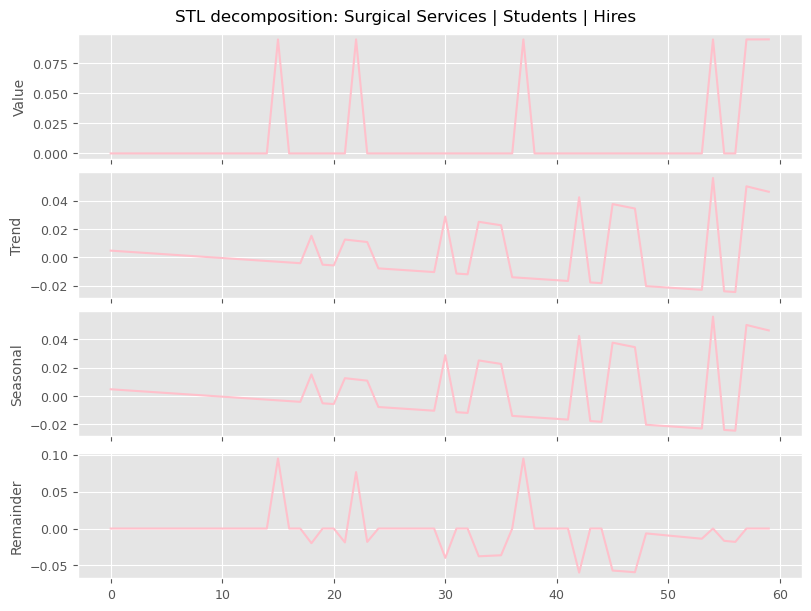


 Results saved: C:\Users\Destinee.HassanBien\Documents\Desys Work\stl_decomposition_tsfeatures.csv
             service group                      staff group    metric  \
0  CYP & Families Services  Add Prof Scientific and Technic     Hires   
1  CYP & Families Services  Add Prof Scientific and Technic   Leavers   
2  CYP & Families Services  Add Prof Scientific and Technic  Sickness   
3  CYP & Families Services     Additional Clinical Services     Hires   
4  CYP & Families Services     Additional Clinical Services   Leavers   

   n_months  boxcox_lambda                                          unique_id  \
0        49        -15.415  CYP & Families Services|Add Prof Scientific an...   
1        37        -10.626  CYP & Families Services|Add Prof Scientific an...   
2       434         -0.335  CYP & Families Services|Add Prof Scientific an...   
3       180         -5.300  CYP & Families Services|Additional Clinical Se...   
4       150         -6.287  CYP & Families Services|Addi

In [8]:
def try_boxcox(series):
    """Optional: Stabilise variance with Box-Cox, revert to raw if not possible."""
    offset = 0.01 if (series <= 0).any() else 0
    shifted = series + offset
    try:
        from coreforecast.scalers import boxcox as boxcox_core
        from coreforecast.scalers import boxcox_lambda as boxcox_lambda_core

        lam = boxcox_lambda_core(shifted)
        transformed = boxcore_core(shifted, lam)
        return pd.Series(transformed, index=series.index), lam, offset
    except Exception:
        try:
            from spicy import stats

            transformed, lam = stats.boxcox(shifted)
            return pd.Series(transformed, index=series.index), lam, offset
        except Exception:
            return series, None, offset


summary_rows = []
for idx, row in long_groups.iterrows():
    # Dynamically extract keys for all group columns
    keys = [row[col] for col in group_cols]
    # Construct a boolean mask for all levels in group_cols
    mask = all_agg[group_cols[0]] == keys[0]
    for i in range(1, len(group_cols)):
        mask &= all_agg[group_cols[i]] == keys[i]
    group_df = all_agg[mask].copy().sort_values("month")
    ts = group_df.set_index("month")["count"]

    ts_trans, lam, offset = try_boxcox(ts)
    if len(ts_trans) < 24:
        continue  # saftey check

    stl = STL(ts_trans, period=12, seasonal=13, trend=21, robust=True)
    res_stl = stl.fit()
    dcmp = pd.DataFrame(
        {
            "ds": ts_trans.index,
            "data": ts_trans.values,
            "trend": res_stl.seasonal,
            "seasonal": res_stl.seasonal,
            "remainder": res_stl.resid,
        }
    ).reset_index(drop=True)

    # Plot
    fig, axes = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(8, 6))
    sns.lineplot(data=dcmp, x=dcmp.index, y="data", ax=axes[0])
    sns.lineplot(data=dcmp, x=dcmp.index, y="trend", ax=axes[1])
    sns.lineplot(data=dcmp, x=dcmp.index, y="seasonal", ax=axes[2])
    sns.lineplot(data=dcmp, x=dcmp.index, y="remainder", ax=axes[3])
    axes[0].set_ylabel("Value")
    axes[1].set_ylabel("Trend")
    axes[2].set_ylabel("Seasonal")
    axes[3].set_ylabel("Remainder")
    fig.suptitle(f"STL decomposition: {' | '.join(keys)}")
    fig.subplots_adjust(top=0.90)
    plt.xlabel("")
    plt.show()

    # Time Series Features Extraction
    ts_feat_df = pd.DataFrame(
        {
            "unique_id": ["|".join([str(k) for k in keys])] * len(ts_trans),
            "ds": ts_trans.index,
            "y": ts_trans.values,
        }
    )

    # Compute statistics, ACF, STL features
    feats = (
        tsfeatures(
            ts_feat_df,
            freq=12,
            features=[statistics, acf_features, stl_features],
            scale=False,
        )
        .iloc[0]
        .to_dict()
    )

    row_dict = {col: val for col, val in zip(group_cols, keys)}
    row_dict.update({"n_months": len(ts_trans), "boxcox_lambda": lam})
    row_dict.update(feats)
    summary_rows.append(row_dict)

# Save results
summary_df = pd.DataFrame(summary_rows)
summary_path = os.path.join(base_dir, "stl_decomposition_tsfeatures.csv")
summary_df.to_csv(summary_path, index=False)
print(f"\n Results saved: {summary_path}")
print(summary_df.head())

## 10. 📝 Summary & Next Steps

- Scan the summary for groups with exceptionally strong or weak trend/seasonality.
- Flag any with low n_months or missing features for exclusion or special review.
- Next: feed this table into clustering, auto-model selection, or Trust-wide comparison dashboards.

## 11. ✔️ To Do / Collaboration Checklist

 To Do
- [ ] Print progress every 10 groups so long loops are debug-friendly.
- [ ] Add export of missing/n_months < 24 groups/panels.
- [ ] Annotate unusual STL decompositions in markdown for later investigation.
- [ ] Remove/flag groups with outlier negative trend or spiky remainder features for review with HR/Workforce leads.